In [1]:
# Import packages
import netCDF4 as nc
import numpy as np
import pandas as pd
from itp_python.itp_query import ItpQuery
from datetime import datetime
import gsw
import seawater as sw
from netCDF4 import Dataset, MFDataset, num2date
import math
import matplotlib as mpl
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib import ticker, cm
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from cartopy.util import add_cyclic_point
import mpld3
from mpld3 import plugins, utils
mpld3.enable_notebook()

In [2]:
# Set ITP Query Parameters and path
itp_path = r'C:\Users\eliza\OneDrive\Documents\ITP_data\itp_final_2021_03_04.db'
itp1 = 54
itp2 = 53
year = 2011

summer = True
stationary = True
compare = True

if summer == True:
    month1 = 5
    month2 = 10
    itpname1 = '{itp}c'.format(itp=itp1)
    year1 = year
    year2 = year
else:
    month1 = 10
    month2 = 3
    itpname1 = '{itp}c'.format(itp=itp1)
    year1 = year
    year2 = year+1

if stationary == True:
    stat = 'stat'
else:
    stat = ''
    
# Set time range for ITP data
# Maybe make a file for the times and use that to extract times
if compare==True:
    df = pd.read_pickle(r'C:\Users\eliza\OneDrive\Documents\Python Scripts\compare_start_end2.pkl')
    start_date = df['Time'][0]
    end_date = df['Time'][1]
    itpname1 = '{itp}c'.format(itp=df['ITP'][0])
    itpname2 = '{itp}c-ddragiiii'.format(itp=df['ITP'][0])
else:
    start_date = datetime(year1, month1, 1)
    end_date = datetime(year2, month2, 1)

time_range = [start_date, end_date]

In [3]:
#Set start of epoch for plotting dates
mdates.set_epoch(start_date)

print_startdate = start_date.strftime('%Y_%m_%d')
print_enddate = end_date.strftime('%Y_%m_%d')

#Set start of epoch for plotting dates
# mdates.set_epoch(start_date)

print('Making Output Plots for ITP {itpname} path from {start} to {end}'
      .format(itpname=itpname1, start=start_date, end=end_date))

nc_path1 = r'C:\Users\eliza\OneDrive\Documents\Python Scripts\output\pwp_output_itp{itp}.nc'.format(itp=itpname1)
nc1 = Dataset(nc_path1)
nc_path2 = r'C:\Users\eliza\OneDrive\Documents\Python Scripts\output\pwp_output_itp{itp}.nc'.format(itp=itpname2)
nc2 = Dataset(nc_path2)

Making Output Plots for ITP 54c path from 2011-09-08 00:00:06 to 2011-10-10 00:00:01


In [4]:
temp = nc1.variables['temp']
sal = nc1.variables['sal']
dens = nc1.variables['dens']
depth = nc1.variables['z']
time = nc1.variables['time']
mld1 = nc1.variables['mld1']
mld2 = nc1.variables['mld2']
u = nc1.variables['uvel']
v = nc1.variables['vvel']
hi = nc1.variables['hi']
hi2 = nc1.variables['hi2']
ocnhf = nc1.variables['ocnhf']
tsurf = nc1.variables['temp_surf']
tfz = nc1.variables['temp_fz']
qnet_o = nc1.variables['qnet_o']
qnet_i = nc1.variables['qnet_i']
tmld1 = nc1.variables['temp_mld1']
tmld2 = nc1.variables['temp_mld2']
mldidx1 = nc1.variables['mld_idx1']
mldidx2 = nc1.variables['mld_idx2']

In [5]:
tempm2 = nc2.variables['temp']
salm2 = nc2.variables['sal']
densm2 = nc2.variables['dens']
depthm2 = nc2.variables['z']
timem2 = nc2.variables['time']
mld1m2 = nc2.variables['mld1']
mld2m2 = nc2.variables['mld2']
um2 = nc2.variables['uvel']
vm2 = nc2.variables['vvel']
him2 = nc2.variables['hi']
hi2m2 = nc2.variables['hi2']
ocnhfm2 = nc2.variables['ocnhf']
tsurfm2 = nc2.variables['temp_surf']
tfzm2 = nc2.variables['temp_fz']
qnet_om2 = nc2.variables['qnet_o']
qnet_im2 = nc2.variables['qnet_i']
tmld1m2 = nc2.variables['temp_mld1']
tmld2m2 = nc2.variables['temp_mld2']
mldidx1m2 = nc2.variables['mld_idx1']
mldidx2m2 = nc2.variables['mld_idx2']

In [6]:
#Set Query for ITP database
query1 = ItpQuery(itp_path, system=[itp1], pressure=[0, 100], date_time=time_range)
results1 = query1.fetch()

query2 = ItpQuery(itp_path, system=[itp2], pressure=[0, 100], date_time=time_range)
results2 = query2.fetch()

print(len(results1))
print(len(results2))
print(results1[0].python_datetime(),results1[-1].python_datetime())
print(results2[0].python_datetime(),results2[-1].python_datetime())

52
64
2011-09-08 00:00:06 2011-10-09 06:00:05
2011-09-08 06:00:01 2011-10-10 00:00:01


In [7]:
### Find where the two ITPs cross paths ###
longitude1 = np.array([p.longitude for p in results1])
latitude1 = np.array([p.latitude for p in results1])

longitude2 = np.array([p.longitude for p in results2])
latitude2 = np.array([p.latitude for p in results2])

print(np.shape(longitude1))
print(np.shape(longitude2))

### Find where the two ITPs were the closest ###
closest = []
closest_index = []
for i in range(len(longitude1)):
    a = abs(latitude1[i]-latitude2)+abs(longitude1[i]-longitude2)
    x = np.unravel_index(a.argmin(),a.shape)[0]
    closest.append(a[x])
    closest_index.append(x)

(52,)
(64,)


In [8]:
### closest index for results 1 ###
x = closest.index(min(closest))
y = closest_index[x]
print(y)
print(x)
print(latitude1[x],longitude1[x])
print(latitude2[y],longitude2[y])

63
2
77.2865 -139.4303
77.2883 -139.4411


In [9]:
#Get profile data from ITP A
sal1 = results1[x].salinity
temp1 = results1[x].temperature
dens1 = results1[x].density()
depth1 = results1[x].depth()
date1 = results1[x].python_datetime()
lat1 = results1[x].latitude
lon1 = results1[x].longitude

#Get profile data from ITP B
sal2 = results2[y].salinity
temp2 = results2[y].temperature
dens2 = results2[x].density()
depth2 = results2[y].depth()
date2 = results2[y].python_datetime()
lat2 = results2[y].latitude
lon2 = results2[y].longitude

print(date1,date2)
print(lat1, lat2)

2011-09-08 12:00:06 2011-10-10 00:00:01
77.2865 77.2883


In [10]:
### Adjust water column for heaving using a thermohaline ###
refdepth = 80
refdepth_idx = np.argmin(abs(depth1-refdepth))
refdepth_idx2 = np.argmin(abs(depth2-refdepth))
reftemp = temp1[refdepth_idx]

#Find where the reference temperature is closest in the other profile below a certain depth
depth_below = 70
depth_below_idx = np.argmin(abs(depth1-depth_below))
temp2_idx = np.argmin(abs(temp2[depth_below_idx:]-reftemp))+depth_below_idx

#Set the depth off set between depths of the two temperatures
ddiff = depth1[refdepth_idx] - depth2[temp2_idx]
print(ddiff)

depth2 = depth2 + ddiff

0.9891357187001688


785


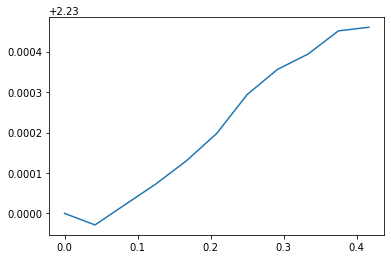

In [11]:
plt.plot(time[:11], hi[:11])
temp_array = np.array(temp)
sal_array = np.array(sal)
print(len(time))

In [12]:
class LinkedView(plugins.PluginBase):
    
    """A simple plugin showing how multiple axes can be linked"""

    JAVASCRIPT = """
    mpld3.register_plugin("linkedview", LinkedViewPlugin);
    LinkedViewPlugin.prototype = Object.create(mpld3.Plugin.prototype);
    LinkedViewPlugin.prototype.constructor = LinkedViewPlugin;
    LinkedViewPlugin.prototype.requiredProps = ["idpts", "idline", "data"];
    LinkedViewPlugin.prototype.defaultProps = {}
    function LinkedViewPlugin(fig, props){
        mpld3.Plugin.call(this, fig, props);
    };

    LinkedViewPlugin.prototype.draw = function(){
      var pts = mpld3.get_element(this.props.idpts);
      var line = mpld3.get_element(this.props.idline);
      var data = this.props.data;

      function mouseover(d, i){
        line.data = data[i];
        line.elements().transition()
            .attr("d", line.datafunc(line.data))
            .style("stroke", this.style.fill);
      }
      pts.elements().on("mouseover", mouseover);
    };
    """

    def __init__(self, points, line, linedata):
        if isinstance(points, mpl.lines.Line2D):
            suffix = "pts"
        else:
            suffix = None

        self.dict_ = {"type": "linkedview",
                      "idpts": utils.get_id(points, suffix),
                      "idline": utils.get_id(line),
                      "data": linedata}

In [13]:
# class LinkedView2(plugins.PluginBase):
#     JAVASCRIPT = """
#     mpld3.register_plugin("linkedview", LinkedViewPlugin);
#     LinkedViewPlugin.prototype = Object.create(mpld3.Plugin.prototype);
#     LinkedViewPlugin.prototype.constructor = LinkedViewPlugin;
#     LinkedViewPlugin.prototype.requiredProps = ["idpts", "idline", "data", "idpts2", "idline2", "data2"];
#     LinkedViewPlugin.prototype.defaultProps = {}
#     function LinkedViewPlugin(fig, props){
#         mpld3.Plugin.call(this, fig, props);
#     };

#     LinkedViewPlugin.prototype.draw = function(){
#       var pts = mpld3.get_element(this.props.idpts);
#       var line = mpld3.get_element(this.props.idline);
#       var data = this.props.data;
#       var pts2 = mpld3.get_element(this.props.idpts2);
#       var line2 = mpld3.get_element(this.props.idline2);
#       var data2 = this.props.data2;

#       function mouseover(d, i){
#         line.data = data[i];
#         line.elements().transition()
#             .attr("d", line.datafunc(line.data))
#             .style("stroke", this.style.fill);
#         line2.data2 = data2[i];
#         line2.elements().transition()
#             .attr("d", line2.datafunc(line2.data2))
#             .style("stroke", this.style.fill);
#       }
#       pts.elements().on("mouseover", mouseover);
#       pts2.elements().on("mouseover", mouseover);
#     };
#     """

#     def __init__(self, points, line, linedata):
#         if isinstance(points[0], mpl.lines.Line2D):
#             suffix = "pts"
#         else:
#             suffix = None

#         self.dict_ = {"type": "linkedview",
#                       "idpts": utils.get_id(points[0], suffix),
#                       "idline": utils.get_id(line[0]),
#                       "data": linedata[0],
#                       "idpts2": utils.get_id(points[1], suffix),
#                       "idline2": utils.get_id(line[1]),
#                       "data2": linedata[1]}

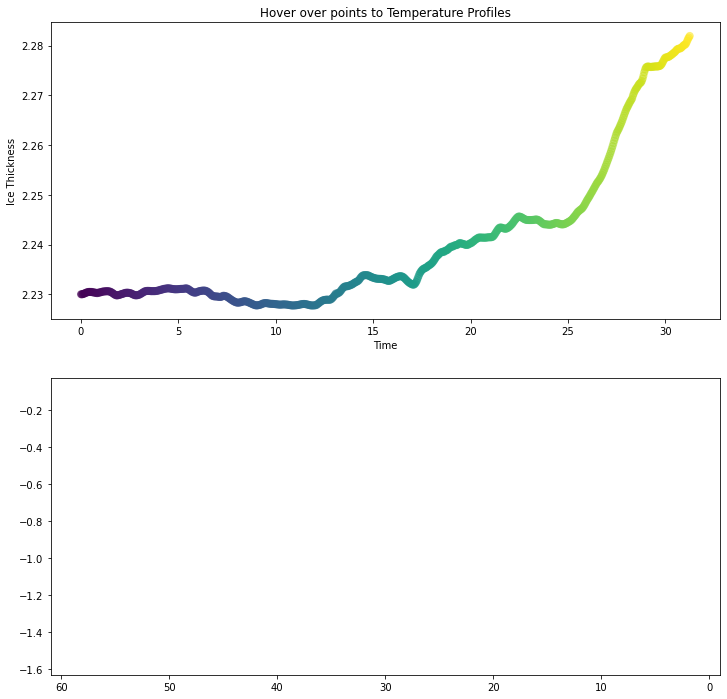

In [14]:
fig = plt.figure(figsize=(12,12))

ax1 = fig.add_subplot(2,1,1)
ax2 = fig.add_subplot(2,1,2)

# ax1 = fig.add_subplot(2,2,(1,2))
# ax2 = fig.add_subplot(2,2,3)
# ax3 = fig.add_subplot(2,2,4)

# scatter periods and amplitudes
t = time[0:751]
# print(len(t))
h = hi[0:751]
time_idx = np.linspace(0, 750, 751, dtype=int)
# dep_idx = np.linspace(0,200, 201, dtype=int)
data = np.array([[depth[:], temp_array[:, j]] for j in time_idx])
# data2 = np.array([[depth[:], sal_array[:, j]] for j in time_idx])

# print(np.shape(data2))
# print(data)

points = ax1.scatter(t, h, c=t + h, s=50, alpha=0.5)
ax1.set_xlabel('Time')
ax1.set_ylabel('Ice Thickness')

# create the line object
lines = ax2.plot(depth, temp_array[:,0], '-w', lw=3, alpha=0.75)
ax2.set_xlim(61, -1)

# # create the line object
# lines2 = ax3.plot(depth, sal_array[:,0], '-w', lw=3, alpha=0.75)
# ax3.set_xlim(61, -1)

ax1.set_title("Hover over points to Temperature Profiles")

# transpose line data and add plugin
linedata = data.transpose(0, 2, 1).tolist()
# linedata2 = data2.transpose(0, 2, 1).tolist()
plugins.connect(fig, LinkedView(points, lines[0], linedata))
# plugins.connect(fig, LinkedView2((points, points), (lines1[0], lines2[0]), (linedata1, linedata2)))

# labels = ["Point {0}".format(i) for i in range(len(t))]
# tooltip = plugins.PointLabelTooltip(points, labels)

# plugins.connect(fig, tooltip)

mpld3.save_html(fig, r'C:\Users\eliza\OneDrive\Documents\Yale\Python_Plots\GUIs\gui2.html')

In [15]:
# fig, ax = plt.subplots(2)

# # scatter periods and amplitudes
# np.random.seed(0)
# P = 0.2 + np.random.random(size=20)
# A = np.random.random(size=20)
# x = np.linspace(0, 10, 100)
# data = np.array([[x, Ai * np.sin(x / Pi)] for (Ai, Pi) in zip(A, P)])
# print(np.shape(data))
# points = ax[0].scatter(P, A, c=P + A, s=200, alpha=0.5)
# ax[0].set_xlabel('Period')
# ax[0].set_ylabel('Amplitude')

# # create the line object
# lines = ax[1].plot(x, 0* x, '-w', lw=3, alpha=0.5)
# # print(np.shape(lines))
# ax[1].set_ylim(-1, 1)

# ax[0].set_title("Hover over points to see lines")

# # transpose line data and add plugin
# linedata = data.transpose(0, 2, 1).tolist()
# print(np.shape(lines[0]))
# # print(linedata[2])
# plugins.connect(fig, LinkedView(points, lines[0], linedata))

# # mpld3.display()